# IMAGE ENCRYPTION USING AES

- Numpy array which is used to store the pixels are encrypted and is later decrypted using AES (Advanced Encryption Standard)
- Source AES Algorithm : https://gist.github.com/PaburoTC/74f96510479d5129100b994d1c06885a#file-aescipher-py
- Module : Crypto in IDLE and Cryptodome in Jupyter Notebook 
  - Use pip install pycryptodome to install the package

In [1]:
from PIL import Image
import numpy as np
from IPython import display

import hashlib
from Cryptodome import Random
from Cryptodome.Cipher import AES
from base64 import b64encode, b64decode

import os

import ast
import time

import cv2

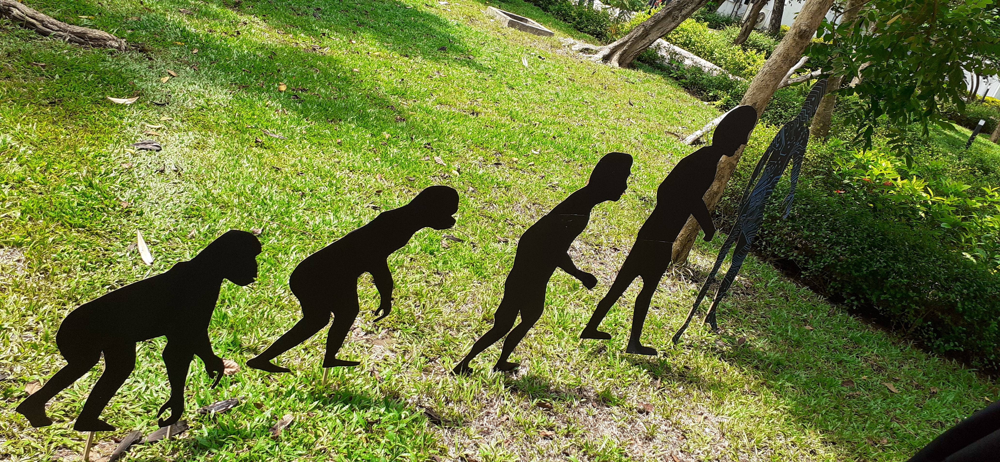

In [2]:
path="res/20190913_104613.jpg"

name,extension=os.path.splitext(path)

if(extension==".png"):
    img_png=cv2.imread(path)
    cv2.imwrite(name+".jpg", img_png, [int(cv2.IMWRITE_JPEG_QUALITY), 100])

img=Image.open(name+".jpg")

np_image=np.array(img) # PIXELS ARE STORED IN A NP-ARRAY
display.Image(path)

In [3]:
print(len(np_image),len(np_image[0]),img.size)

1908 4128 (4128, 1908)


In [4]:
np_image=list(np_image)

### DEFINING A SYMMETRIC KEY TO BE USED IN AES

In [5]:
key="aespython"

In [6]:
def pad(plain_text,block_size):
    number_of_bytes_to_pad=block_size-len(plain_text)%block_size
    ascii_string=chr(number_of_bytes_to_pad)
    padding_str=number_of_bytes_to_pad*ascii_string
    padded_plain_text=plain_text+padding_str
    return padded_plain_text

def unpad(plain_text):
    last_character=plain_text[len(plain_text)-1:]
    return plain_text[:-ord(last_character)]

block_size=AES.block_size

### ENCRYPTION USING AES

In [18]:
def encrypt(plain_text,key,block_size):
    plain_text=pad(plain_text,block_size)
    iv=Random.new().read(block_size)
    cipher=AES.new(key,AES.MODE_CBC,iv)
    encrypted_text=cipher.encrypt(plain_text.encode())
    return b64encode(iv+encrypted_text).decode("utf-8")

digested_key=hashlib.sha256(key.encode()).digest()

encrypted=encrypt(str(np_image),digested_key,block_size)

### DECRYPTION USING AES

In [17]:
def decrypt(encrypted_text,key,block_size):
    encrypted_text=b64decode(encrypted_text)
    iv=encrypted_text[:block_size]
    
    cipher=AES.new(key,AES.MODE_CBC,iv)
    plain_text=cipher.decrypt(encrypted_text[block_size:]).decode("utf-8")
    return unpad(plain_text)

digested_key=hashlib.sha256("aespython".encode()).digest()

decrypted=decrypt(encrypted,digested_key,block_size)

### MODIFICATIONS TO THE DECRYPTED LIST

In [9]:
decrypted=decrypted.replace("b","")
decrypted=decrypted.replace("'","")
decrypted=decrypted.replace("(","")
decrypted=decrypted.replace(")","")
decrypted=decrypted.replace(" ","")
decrypted=decrypted.replace("\\n","")
decrypted=decrypted.replace("array","")
decrypted=decrypted.replace(",dtype=uint8","")

In [10]:
decrypted_final=np_image.copy()

In [11]:
conv_list=ast.literal_eval(decrypted)

for i in range(0,len(conv_list)):
    for j in range(0,len(conv_list[i])):
        if(conv_list[i][j] is Ellipsis):
            continue
        for k in range(0,len(conv_list[i][j])):
            decrypted_final[i][j][k]=int(conv_list[i][j][k])

decrypted_final=np.array(decrypted_final)

### SAVING THE IMAGE

In [12]:
decrypted_img=Image.fromarray(decrypted_final)

decrypted_img.save("res/decrypted.jpg")

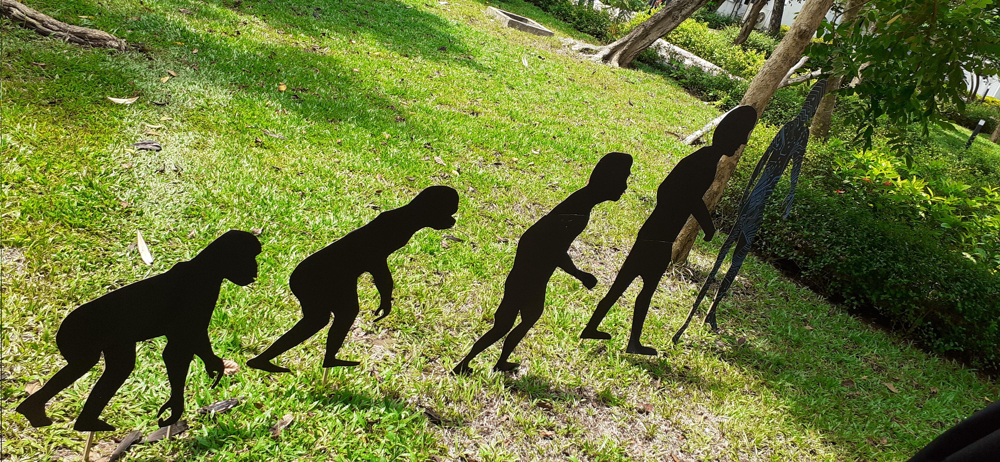

In [13]:
display.Image("res/decrypted.jpg")

### AVERAGE RUNNING TIME

- Avg. time taken by this algorithm  = 0.5 seconds for an image of size 6 MB